# TRABAJO FINAL - DATA VIZ

## PARTE 2 - TEXT ANALYSIS

* Escobar, Aldo
* Alvarez Muñoz, Carolina

In [33]:
import pandas as pd
from nltk.corpus import stopwords
import unidecode
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline
#from stop_words import get_stop_words
import numpy as np
import re
from PIL import Image
from wordcloud import ImageColorGenerator
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.manifold import TSNE
import gensim
from gensim.models import Word2Vec
from yellowbrick.text import TSNEVisualizer
from html5lib.sanitizer import HTMLSanitizerMixin
from nltk import word_tokenize
import string
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import pyLDAvis
import pyLDAvis.sklearn
from sklearn.decomposition import LatentDirichletAllocation
pyLDAvis.enable_notebook()
import math
import random

stop_words = stopwords.words('english')
tags_html = HTMLSanitizerMixin.acceptable_elements

# Funciones para limpieza de texto
Se crearon funciones para la limpieza de código HTML que había adentro de los textos. Ademas otra para normalizar (sacar caracteres especiales, etc)

In [3]:
def cleanhtml(raw_html):
  cleanr = re.compile('<.*?>')
  cleantext = re.sub(cleanr, '', raw_html)
  cleantext = cleantext.replace('\n', ' ')
  return cleantext

In [4]:
def normalize(string):
    return re.sub("[^0-9a-zA-Z]+", " ", string.lower())

# Funcion para generar una DF que contiene el conteo palabras más frecuentes. 
La misma está ordenada de manera descendiente. Se la define para luego generar un gráfico de barras

In [5]:
def generateDFCounts(words_series):
    words=[]
    for w in list(words_series):
                w=w.lower()
                w = unidecode.unidecode(w)
                words.append(" ".join([word for word in w.split() if word not in stop_words and word not in tags_html+["href", "ilink", "class", "amp"]])) 
    vec = CountVectorizer(stop_words=stop_words).fit(words)
    bag_of_words = vec.transform(words)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    words=dict(words_freq)
    df_words = pd.DataFrame(
        {'word': list(words.keys()),
         'word_count': list(words.values())
        })
    return df_words

# Funcion para crear TSNE model y plotearlo

In [74]:
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16));
    for i in range(len(x)):
        plt.scatter(x[i],y[i]);
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom');
    plt.show();

# Funcion generadora de paleta de colores y de wordclouds

In [ ]:
max_font_size = 300
random.seed(2019)

def blue_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "rgb(0, 0, %s)" % math.floor(font_size/max_font_size * 255)

def red_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "hsl(10, 100%%, %d%%)" % random.randint(40, 100)

In [90]:
def generateWordCloud(data, color):

    texts=' '.join(data)
    texts=unidecode.unidecode(texts)

    for word in removeWords:
        texts = re.sub(r'\b' + word + r'\b', '',texts)

    wordcloud_essay = WordCloud(stopwords=stop_words, width=1880, height=260, background_color="white",repeat=False, collocations=False, max_words=100).generate(texts)
    plt.figure(figsize=[30,30])
    if color == None:
        plt.imshow(wordcloud_essay.recolor(color), interpolation="bilinear")
    else:
        plt.imshow(wordcloud_essay.recolor(color_func=color, random_state=2019), interpolation="bilinear")
    plt.axis("off")

# Essays
The essay prompts corresponding to the columns 'Essay 0...9' are

* essay0: My self summary
* essay1: What I’m doing with my life
* essay2: I’m really good at
* essay3: The first thing people usually notice about me
* essay4: Favorite books, movies, show, music, and food
* essay5: The six things I could never do without
* essay6: I spend a lot of time thinking about
* essay7: On a typical Friday night I am
* essay8: The most private thing I am willing to admit
*  essay9: You should message me if...

In [7]:
df_essay=pd.read_csv("profiles.csv", usecols=["essay0", "essay1","essay2", "essay3","essay4", "essay5","essay6", "essay7","essay8", "essay9", "sex"])
df_essay=df_essay.fillna(({'essay0':'','essay1':'','essay2':'','essay3':'','essay4':'','essay5':'',
               'essay6':'','essay7':'','essay8':'','essay9':'',}))

for i in range(10):
    df_essay["essay"+str(i)] = df_essay["essay"+str(i)].apply(cleanhtml)
    df_essay["essay"+str(i)] = df_essay["essay"+str(i)].apply(normalize)

df_essay_m = df_essay[df_essay["sex"]=="m"]
df_essay_f = df_essay[df_essay["sex"]=="f"]
df_essay.head()

,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,sex
0,about me i would love to think that i was some...,currently working as an international agent fo...,making people laugh ranting about a good salti...,the way i look i am a six foot half asian half...,books absurdistan the republic of mice and men...,food water cell phone shelter,duality and humorous things,trying to find someone to hang out with i am d...,i am new to california and looking for someone...,you want to be swept off your feet you are tir...,m
1,i am a chef this is what that means 1 i am a w...,dedicating everyday to being an unbelievable b...,being silly having ridiculous amonts of fun wh...,,i am die hard christopher moore fan i don t re...,delicious porkness in all of its glories my bi...,,,i am very open and will share just about anyth...,,m
2,i m not ashamed of much but writing public tex...,i make nerdy software for musicians artists an...,improvising in different contexts alternating ...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement conversation creation contemplation t...,,viewing listening dancing talking drinking per...,when i was five years old i was known as the b...,you are bright open intense silly ironic criti...,m
3,i work in a library and go to school,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,bataille celine beckett lynch jarmusch r w fas...,,cats and german philosophy,,,you feel so inclined,m
4,hey how s it going currently vague on the prof...,work work work work play,creating imagery to look at http bagsbrown blo...,i smile a lot and my inquisitive nature,music bands rappers musicians at the moment th...,,,,,,m


# Playing with essay5 - The six things I could never do without
Ploteo de barras de palabras más frecuentes escritos en general (hombres y mujeres), escritos por hombres y por mujeres.

In [9]:
df_words = generateDFCounts(df_essay.essay5)
df_words_m = generateDFCounts(df_essay_m.essay5)
df_words_f = generateDFCounts(df_essay_f.essay5)


In [10]:
data  = [go.Bar(
              y = df_words.head(20).word[::-1],
              x = df_words.head(20).word_count[::-1],
              orientation='h')]
layout = go.Layout(
        title = "Top 20 Most Frequent Words")

fig  = go.Figure(data=data, layout=layout)
iplot(fig)

In [11]:
data  = [go.Bar(
              y = df_words_m.head(20).word[::-1],
              x = df_words_m.head(20).word_count[::-1],
              orientation='h')]
layout = go.Layout(
        title = "Top 20 Most Frequent Words - Male")

fig  = go.Figure(data=data, layout=layout)
iplot(fig)

In [12]:
data  = [go.Bar(
              y = df_words_f.head(20).word[::-1],
              x = df_words_f.head(20).word_count[::-1],
              orientation='h')]
layout = go.Layout(
        title = "Top 20 Most Frequent Words - Female")

fig  = go.Figure(data=data, layout=layout)
iplot(fig)

In [13]:
removeWords=[]
removeWords.append("br")
removeWords.append("ilink")
removeWords.append("href")
removeWords.append("ve")
removeWords.append("don")
removeWords.append("ll")
removeWords.append("amp")

# WORDCLOUDS GENERAL - WORDCLOUDS MALE - WORDCLOUDS FEMALE

## WORD CLOUD #0 -  My self summary

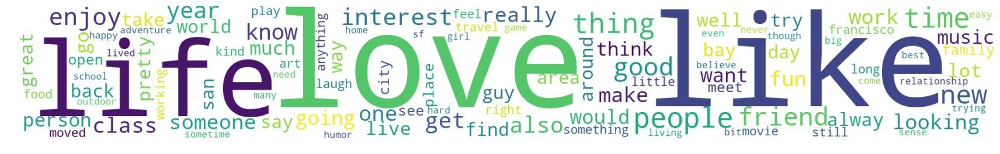

In [91]:
generateWordCloud(df_essay["essay0"], None)

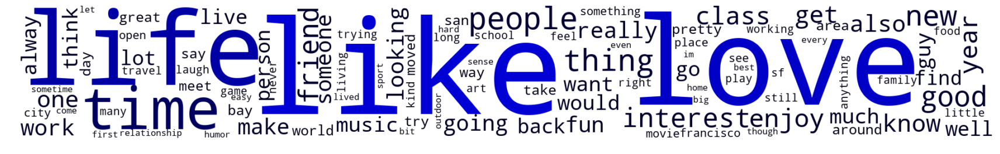

In [92]:
generateWordCloud(df_essay_m["essay0"], blue_color_func)

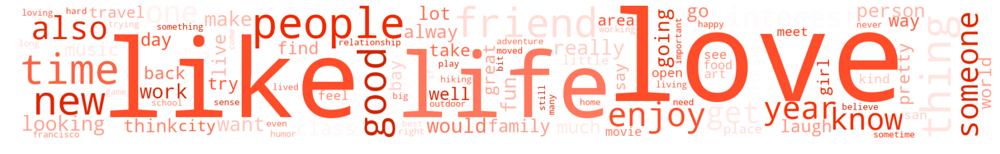

In [94]:
generateWordCloud(df_essay_f["essay0"], red_color_func)

## WORD CLOUD #1 - What I’m doing with my life

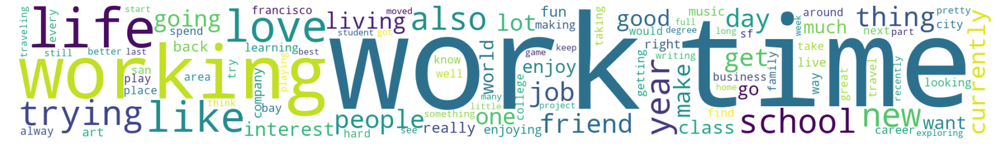

In [95]:
generateWordCloud(df_essay["essay1"], None)

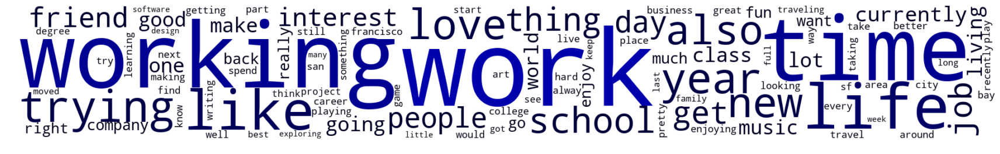

In [104]:
generateWordCloud(df_essay_m["essay1"], blue_color_func)

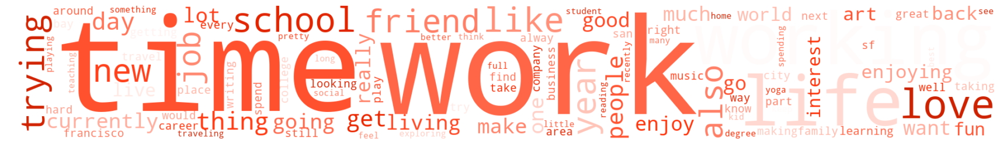

In [111]:
generateWordCloud(df_essay_f["essay1"], red_color_func)

## WORD CLOUD #2 -  I’m really good at

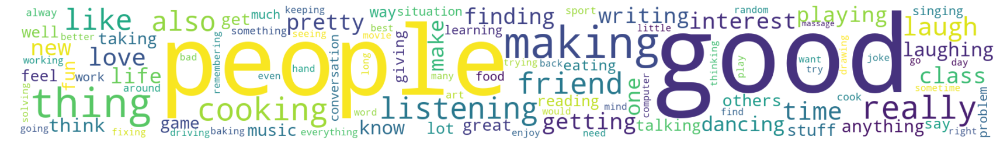

In [96]:
generateWordCloud(df_essay["essay2"], None)

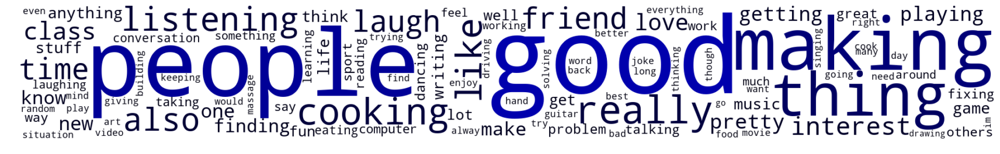

In [105]:
generateWordCloud(df_essay_m["essay2"], blue_color_func)

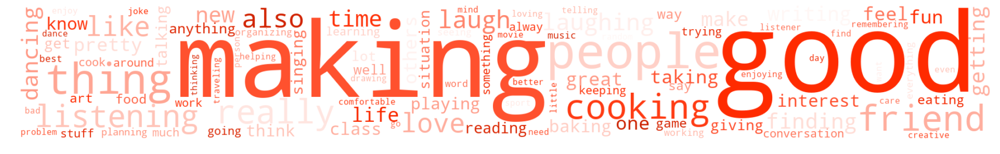

In [112]:
generateWordCloud(df_essay_f["essay2"], red_color_func)

## WORD CLOUD #3 - The first thing people usually notice about me

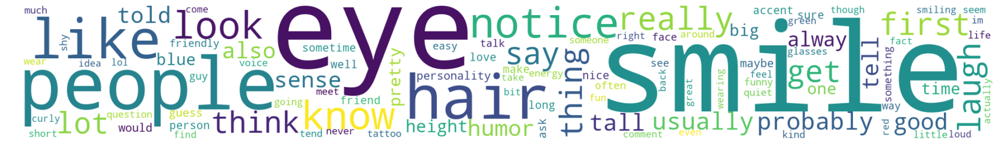

In [97]:
generateWordCloud(df_essay["essay3"], None)

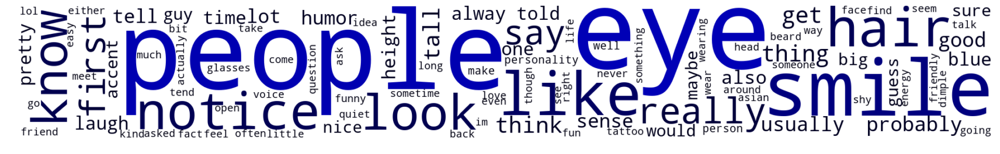

In [106]:
generateWordCloud(df_essay_m["essay3"], blue_color_func)

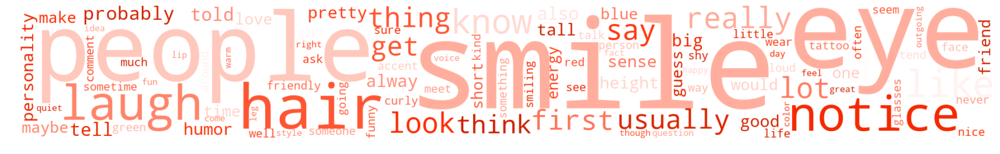

In [113]:
generateWordCloud(df_essay_f["essay3"], red_color_func)

## WORD CLOUD #4 - Favorite books, movies, show, music, and food

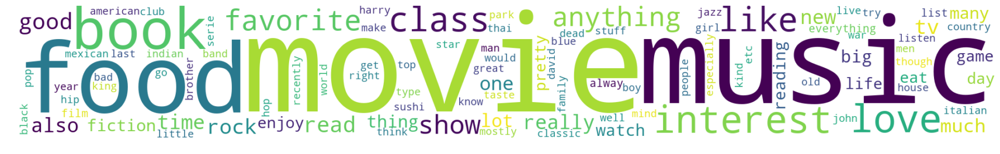

In [98]:
generateWordCloud(df_essay["essay4"], None)

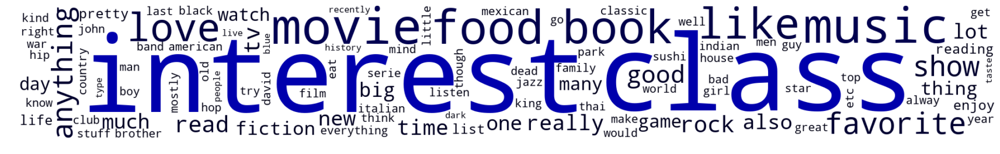

In [78]:
generateWordCloud(df_essay_m["essay4"], blue_color_func)

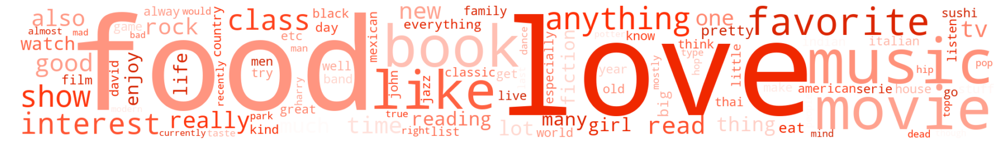

In [114]:
generateWordCloud(df_essay_f["essay4"], red_color_func)

## WORD CLOUD #5 - The six things I could never do without

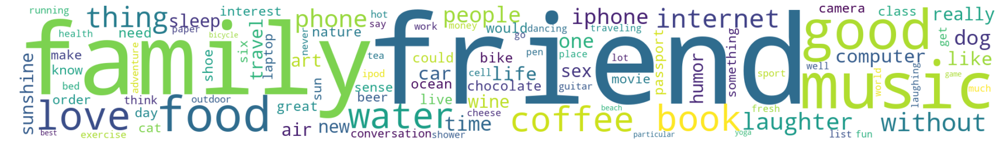

In [99]:
generateWordCloud(df_essay["essay5"], None)

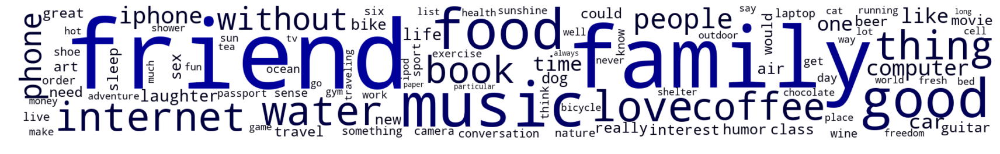

In [115]:
generateWordCloud(df_essay_m["essay5"], blue_color_func)

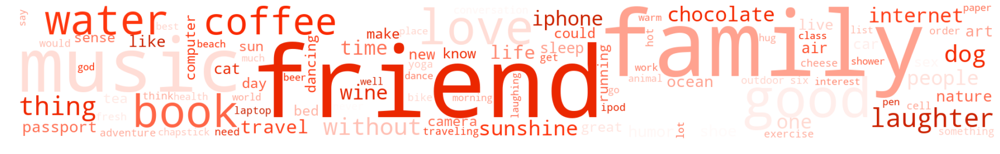

In [116]:
generateWordCloud(df_essay_f["essay5"], red_color_func)

## WORD CLOUD #6 -  I spend a lot of time thinking about

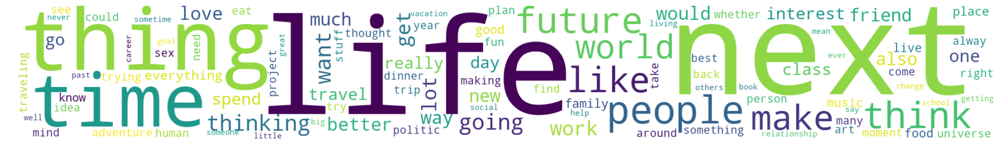

In [100]:
generateWordCloud(df_essay["essay6"], None)

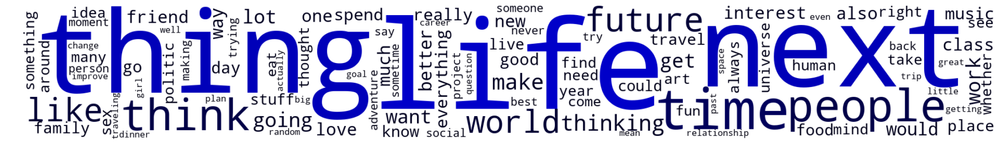

In [107]:
generateWordCloud(df_essay_m["essay6"], blue_color_func)

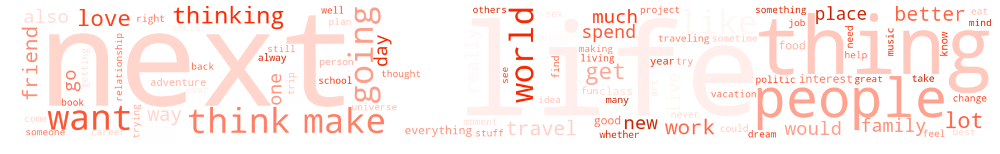

In [117]:
generateWordCloud(df_essay_f["essay6"], red_color_func)

## WORD CLOUD #7 -  On a typical Friday night I am

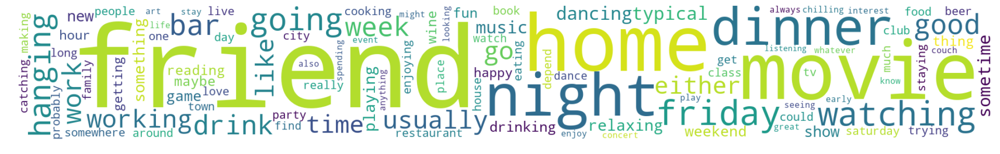

In [101]:
generateWordCloud(df_essay["essay7"], None)

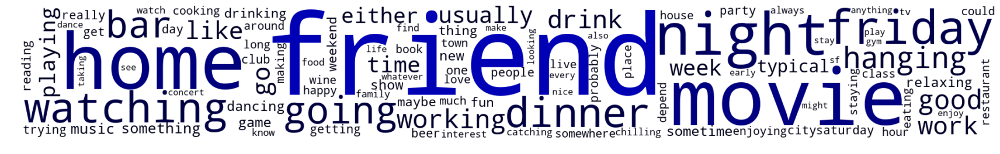

In [108]:
generateWordCloud(df_essay_m["essay7"], blue_color_func)

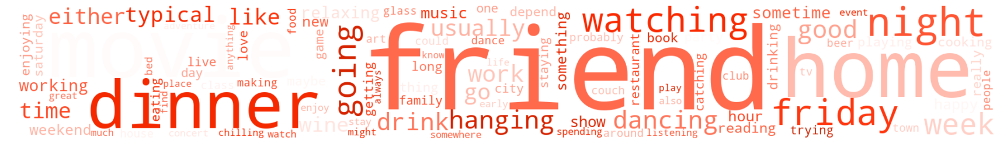

In [118]:
generateWordCloud(df_essay_f["essay7"], red_color_func)

## WORD CLOUD #8 -  The most private thing I am willing to admit

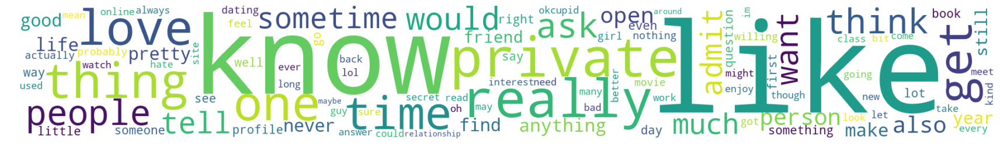

In [102]:
generateWordCloud(df_essay["essay8"], None)

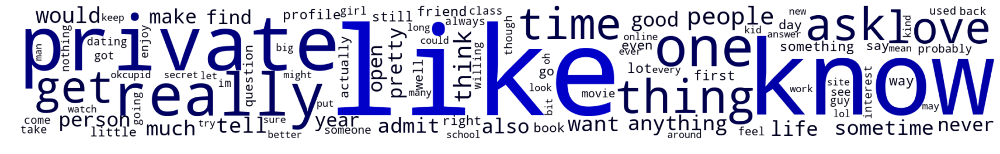

In [109]:
generateWordCloud(df_essay_m["essay8"], blue_color_func)

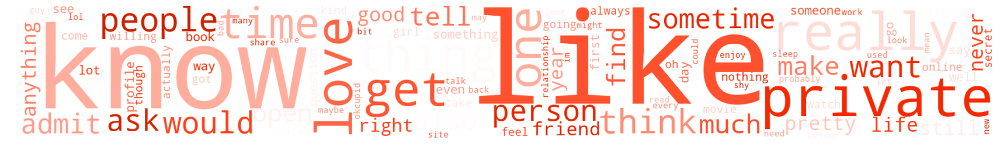

In [119]:
generateWordCloud(df_essay_f["essay8"], red_color_func)

## WORD CLOUD #9 - You should message me if...

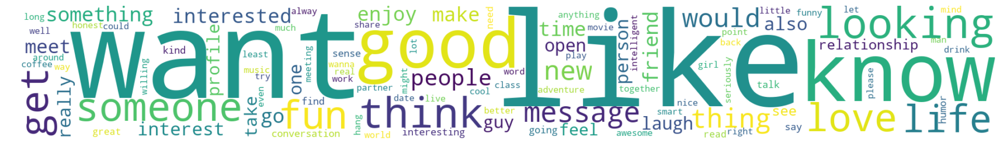

In [103]:
generateWordCloud(df_essay["essay9"], None)

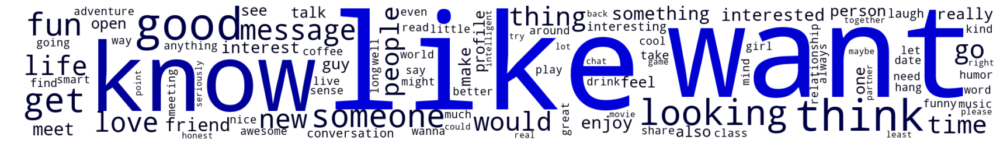

In [110]:
generateWordCloud(df_essay_m["essay9"], blue_color_func)

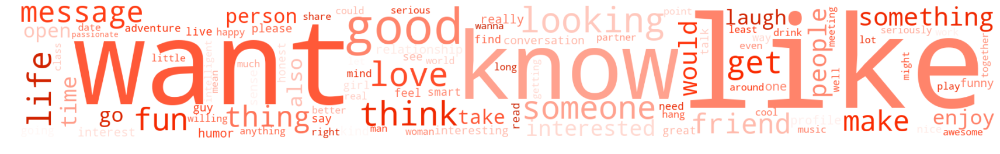

In [120]:
generateWordCloud(df_essay_f["essay9"], red_color_func)

# WORD2VEC MODEL & TSNE PLOT

Armo un modelo word2vec con todas las respuestas. Consulto para algunas palabras cuales son sus palabras "mas cercanas".
Armo el corpus

In [121]:
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(list(df_essay["essay0"])+list(df_essay["essay1"])+list(df_essay["essay2"])+
                                             list(df_essay["essay3"])+list(df_essay["essay4"])+list(df_essay["essay5"])+
                                             list(df_essay["essay6"])+list(df_essay["essay7"])+list(df_essay["essay8"])+
                                             list(df_essay["essay9"]))

model = Word2Vec([i.split() for i in list(df_essay["essay0"])]+[i.split() for i in list(df_essay["essay1"])]
                 +[i.split() for i in list(df_essay["essay2"])]+[i.split() for i in list(df_essay["essay3"])]
                 +[i.split() for i in list(df_essay["essay4"])]+[i.split() for i in list(df_essay["essay5"])]
                 +[i.split() for i in list(df_essay["essay6"])]+[i.split() for i in list(df_essay["essay7"])]
                 +[i.split() for i in list(df_essay["essay8"])] +[i.split() for i in list(df_essay["essay9"])])


print(tfidf_matrix.shape)

(599460, 153466)


In [152]:
# We will also need to get the words closest to a word
model.similar_by_word('movie')

c:\programdata\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning:

Call to deprecated `similar_by_word` (Method will be removed in 4.0.0, use self.wv.similar_by_word() instead).

c:\programdata\anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.



[('flick', 0.7537315487861633),
 ('movies', 0.7115610241889954),
 ('film', 0.62928307056427),
 ('tv', 0.5717287063598633),
 ('films', 0.5600663423538208),
 ('dvd', 0.5397959351539612),
 ('blockbuster', 0.5283714532852173),
 ('show', 0.5193954110145569),
 ('concert', 0.5174226760864258),
 ('comedy', 0.5166565775871277)]

In [153]:
model.similar_by_word('beer')

c:\programdata\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:

Call to deprecated `similar_by_word` (Method will be removed in 4.0.0, use self.wv.similar_by_word() instead).

c:\programdata\anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.



[('whiskey', 0.8079206347465515),
 ('bourbon', 0.7909735441207886),
 ('tequila', 0.7598015666007996),
 ('beers', 0.756783127784729),
 ('brew', 0.756531834602356),
 ('scotch', 0.7562206983566284),
 ('whisky', 0.7284860014915466),
 ('ipa', 0.715017557144165),
 ('cocktails', 0.7097036838531494),
 ('brews', 0.7094950675964355)]

In [157]:
model.similar_by_word('nerd')

c:\programdata\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:

Call to deprecated `similar_by_word` (Method will be removed in 4.0.0, use self.wv.similar_by_word() instead).

c:\programdata\anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.



[('geek', 0.9041211605072021),
 ('science', 0.6298069953918457),
 ('computer', 0.6113077402114868),
 ('video', 0.5278953909873962),
 ('fan', 0.5072599053382874),
 ('somewhat', 0.4734400510787964),
 ('artist', 0.4608227610588074),
 ('bit', 0.43634700775146484),
 ('weird', 0.436163067817688),
 ('history', 0.41632431745529175)]

In [158]:
model.similar_by_word('travel')

c:\programdata\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:

Call to deprecated `similar_by_word` (Method will be removed in 4.0.0, use self.wv.similar_by_word() instead).

c:\programdata\anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.



[('europe', 0.6972476243972778),
 ('traveling', 0.6804459691047668),
 ('places', 0.5691835284233093),
 ('explore', 0.5654255747795105),
 ('traveled', 0.5613213777542114),
 ('trip', 0.4745928645133972),
 ('country', 0.44011425971984863),
 ('south', 0.43883824348449707),
 ('trips', 0.43744349479675293),
 ('exploring', 0.40708959102630615)]

In [72]:
def build_corpus(data):
    "Creates a list of lists containing words from each sentence"
    corpus = []
    for col in ["essay0"]:
    #for col in ["essay0", "essay1","essay2", "essay3","essay4", "essay5","essay6", "essay7","essay8", "essay9"]:
        for sentence in data[col].iteritems():
            word_list = sentence[1].split(" ")
            corpus.append(word_list)
            
    return corpus

corpus = build_corpus(df_essay)

c:\programdata\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).

c:\programdata\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).

c:\programdata\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).

c:\programdata\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).

c:\programdata\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).

c:\programdata\anaconda3\lib\site-p

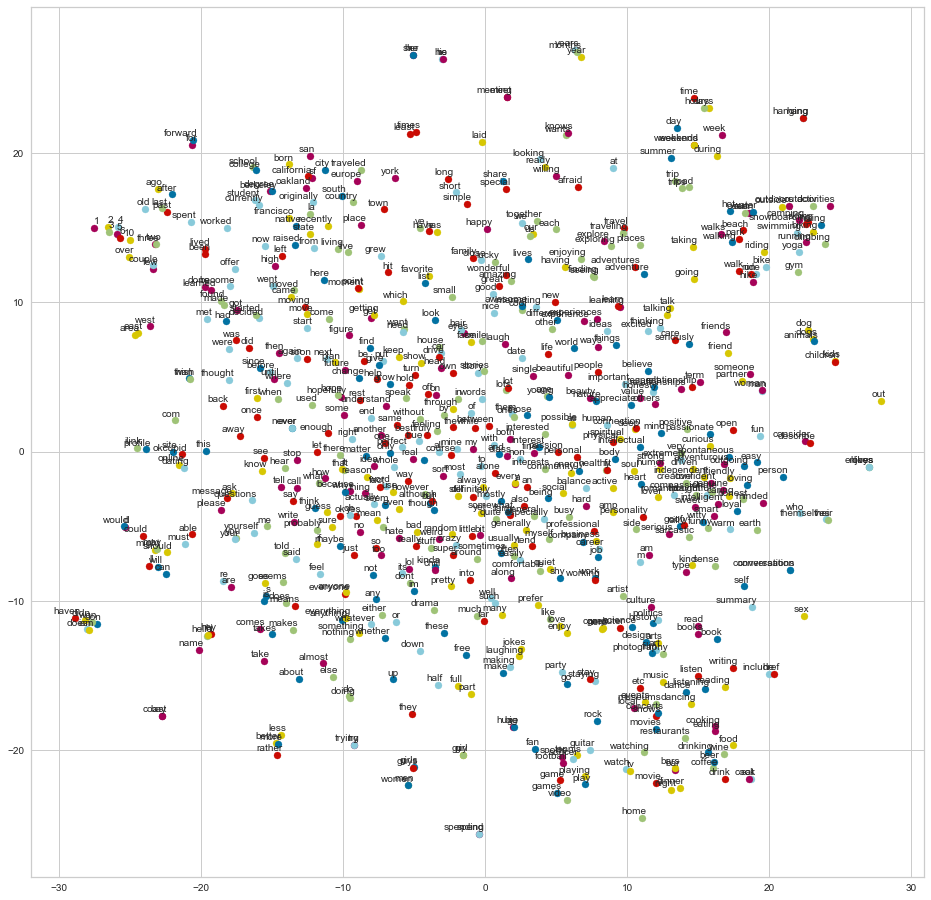

In [76]:
minimodel = Word2Vec(corpus, size=100, window=20, min_count=1000, workers=4)
tsne_plot(minimodel);

# Visualización interactiva de modelos de detección de tópicos


In [46]:
list_essay = list(df_essay.sample(n=40000)["essay0"])

tf_vectorizer = CountVectorizer(stop_words = stop_words+["href", "ilink", "class", "amp", "nbsp"],
                                token_pattern = r'\b[a-zA-Z]{3,}\b')
dtm_tf = tf_vectorizer.fit_transform(list_essay)
tfidf_vectorizer = TfidfVectorizer(**tf_vectorizer.get_params())
dtm_tfidf = tfidf_vectorizer.fit_transform(list_essay)

# for TF DTM
lda_tf = LatentDirichletAllocation(n_topics=8, random_state=2019)
lda_tf.fit(dtm_tf)

c:\programdata\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:1577: UserWarning:

Only (<class 'numpy.float64'>, <class 'numpy.float32'>, <class 'numpy.float16'>) 'dtype' should be used. <class 'numpy.int64'> 'dtype' will be converted to np.float64.

c:\programdata\anaconda3\lib\site-packages\sklearn\decomposition\online_lda.py:314: DeprecationWarning:

n_topics has been renamed to n_components in version 0.19 and will be removed in 0.21



LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='batch', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=10, mean_change_tol=0.001,
             n_components=10, n_jobs=None, n_topics=8, perp_tol=0.1,
             random_state=2019, topic_word_prior=None,
             total_samples=1000000.0, verbose=0)

In [47]:
pyLDAvis.sklearn.prepare(lda_tf, dtm_tf, tf_vectorizer)

PreparedData(topic_coordinates=            Freq  cluster  topics         x         y
topic                                                
0      26.000371        1       1 -0.076667 -0.031673
5      23.098647        1       2 -0.137536  0.026030
7      17.442554        1       3 -0.092639  0.166780
4      10.249293        1       4  0.010113  0.089047
6       9.633744        1       5 -0.018090 -0.137735
1       7.776683        1       6  0.031206 -0.114681
2       2.912259        1       7  0.276441  0.062290
3       2.886447        1       8  0.007174 -0.060058, topic_info=      Category          Freq       Term         Total  loglift  logprob
term                                                                   
24190  Default  10129.000000  interests  10129.000000  30.0000  30.0000
31765  Default  14818.000000        new  14818.000000  29.0000  29.0000
30783  Default   4664.000000      moved   4664.000000  28.0000  28.0000
3940   Default   5866.000000        bay   5866.000000  27.0000  27.0000
40792  Default   5505.000000        san   5505.000000  26.0000  26.0000
27072  Default  18950.000000       life  18950.000000  25.0000  25.0000
31055  Default   7520.000000      music   7520.000000  24.0000  24.0000
2340   Default   5096.000000       area   5096.000000  23.0000  23.0000
18262  Default   4554.000000  francisco   4554.000000  22.0000  22.0000
52918  Default   7473.000000      years   7473.000000  21.0000  21.0000
43854  Default   9232.000000    someone   9232.000000  20.0000  20.0000
2491   Default   3200.000000        art   3200.000000  19.0000  19.0000
47495  Default  13870.000000     things  13870.000000  18.0000  18.0000
8369   Default   5090.000000       city   5090.000000  17.0000  17.0000
27640  Default   9573.000000    looking   9573.000000  16.0000  16.0000
27385  Default   3134.000000      lived   3134.000000  15.0000  15.0000
32941  Default   9085.000000        one   9085.000000  14.0000  14.0000
15201  Default  11254.000000      enjoy  11254.000000  13.0000  13.0000
36953  Default   2197.000000    profile   2197.000000  12.0000  12.0000
20323  Default   2562.000000       grew   2562.000000  11.0000  11.0000
27781  Default  30825.000000       love  30825.000000  10.0000  10.0000
11558  Default   1610.000000     dating   1610.000000   9.0000   9.0000
18983  Default   2519.000000      games   2519.000000   8.0000   8.0000
14345  Default   1987.000000       east   1987.000000   7.0000   7.0000
26057  Default   9563.000000       know   9563.000000   6.0000   6.0000
41233  Default   3587.000000     school   3587.000000   5.0000   5.0000
5454   Default   2540.000000       born   2540.000000   4.0000   4.0000
19854  Default   8550.000000      going   8550.000000   3.0000   3.0000
47504  Default   7161.000000      think   7161.000000   2.0000   2.0000
41721  Default   2973.000000       self   2973.000000   1.0000   1.0000
...        ...           ...        ...           ...      ...      ...
22821   Topic8     69.328346        ice    401.377207   1.7891  -6.7951
47489   Topic8    202.641893      thing   2932.951123   0.8728  -5.7225
19840   Topic8    106.175989       goes   1000.997408   1.3015  -6.3688
36953   Topic8    157.025678    profile   2197.261830   0.9066  -5.9775
43864   Topic8    221.345826  something   4713.580670   0.4867  -5.6342
48923   Topic8    193.699679     trying   3955.320338   0.5286  -5.7676
41636   Topic8    213.257886        see   4902.129103   0.4102  -5.6714
34616   Topic8    391.020956     people  17319.935997  -0.2457  -5.0652
45094   Topic8    190.169258      still   4136.331029   0.4655  -5.7860
19425   Topic8    283.843743        get  10091.454881  -0.0259  -5.3855
32941   Topic8    262.599318        one   9085.165331   0.0014  -5.4633
27146   Topic8    429.850294       like  28989.609615  -0.6661  -4.9705
36841   Topic8    132.509436   probably   2313.362951   0.6853  -6.1473
47504   Topic8    220.781034      think   7161.305935   0.0659  -5.6368
15938   Topic8    118.000330     